(3)=
# 3 Data Preparation

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np

# get custom color palette and colormap
from eda_helper import get_custom_palette, get_custom_colormap

from matplotlib.font_manager import FontProperties

# Register the font
font_path = r"C:\Users\carro\AppData\Local\Microsoft\Windows\Fonts\derailed-regular-webfont.ttf"  # Change this to your font file's path
font_properties = FontProperties(fname=font_path)
font_name = "Derailed"

# Set fonts globally
font_name = "Derailed"
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = font_name
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["mathtext.fontset"] = "stix"

# Create the file paths for reading in data and for outputting figures and tables
DATA_PATH = "../data/saville_row_east_west/"
OUTPUT_TABLES_PATH = "../output/tables/4/"
OUTPUT_FIGURES_PATH = "../output/figures/4/"

os.makedirs(DATA_PATH, exist_ok=True)
os.makedirs(OUTPUT_TABLES_PATH, exist_ok=True)
os.makedirs(OUTPUT_FIGURES_PATH, exist_ok=True)

custom_palette = get_custom_palette()
custom_colormap = get_custom_colormap()

# Read in the files for exploration
east_df = pd.read_pickle(os.path.join(DATA_PATH, "east_df.pkl"))
west_df = pd.read_pickle(os.path.join(DATA_PATH, "west_df.pkl"))

(3.1)=
## 3.1 Data Selection Rationale

* Describe and justify the criteria and methods used to select the data from the initial dataset(s).
* Discuss the relevance of the selected data to the data mining goals defined earlier.
* Explain any assumptions made in this process and any implications for the final results.
* Include the reasons for including or excluding certain attributes.

* Why have we used the sensor we have chosen?
* Why are we excluding trajecotory data?
* Why are we only looking at values? 
* Why are we using a minute granularity?

(3.2)=
## 3.2 Data Cleaning Report

* Detail the process of cleaning the data i.e. dealing missing values, duplicate records, or inconsistent entries.
* Discuss the methods used for cleaning (e.g., deletion, imputation, etc.) and a justification of choices.
* Highlight any challenges faced during the data cleaning process.
* Provide before and after summaries to demonstrate the effects of our cleaning efforts.

As our data is incomplete we are left with a couple of options for the time series data.

1. Leave it as it is (i.e. with random gaps in it)
2. Generate synthetic data to fill in the gaps using imputation methods
3. Only use the continuous sequences of data contained within the dataset

For the time-series we are going to search for the longest continuous sequence available at our selected completeness threshold. For this we will use some custom functions defined in our `eda_helper.py` script. First we will remove the directionality record as it is surplus to requirements (`remove_directionality()`). Next we will remove all days where the number of records is below the completeness threshold for that day using `select_daily_completeness_threshold()`. Finally, we will search through our data to return the first longest sequence available `find_longest_sequence()`. 

In [2]:
from eda_helper import (
    remove_directionality,
    select_daily_completeness_threshold,
    find_longest_sequence,
)

COMPLETENESS_THRESHOLD = 0.94

print("West sensor")
east_directionless_df = remove_directionality(east_df)
east_complete_df = select_daily_completeness_threshold(
    east_directionless_df, COMPLETENESS_THRESHOLD
)
east_complete_sequence_df = find_longest_sequence(
    east_complete_df, COMPLETENESS_THRESHOLD
)

print()

print("East sensor")
west_directionless_df = remove_directionality(west_df)
west_complete_df = select_daily_completeness_threshold(
    west_directionless_df, COMPLETENESS_THRESHOLD
)
west_complete_sequence_df = find_longest_sequence(
    west_complete_df, COMPLETENESS_THRESHOLD
)

West sensor
Removing incomplete days...
Initial number of records: 39904
Number of records in days @ 94% completeness: 32758
Proportion of records removed: 17.91%
Maximum consecutive days: 76
Starting from day number 1 in 2023

East sensor
Removing incomplete days...
Initial number of records: 40099
Number of records in days @ 94% completeness: 32759
Proportion of records removed: 18.30%
Maximum consecutive days: 76
Starting from day number 1 in 2023


In [4]:
completeness_thresholds = [0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99, 1]
sequence_length_east = []
sequence_length_west = []

for completeness in completeness_thresholds:
    east = find_longest_sequence(
        select_daily_completeness_threshold(
            east_directionless_df, completeness, show_prints=False
        ),
        completeness,
        show_prints=False,
    )
    sequence_length_east.append(len(east["date"].unique()))
    west = find_longest_sequence(
        select_daily_completeness_threshold(
            west_directionless_df, completeness, show_prints=False
        ),
        completeness,
        show_prints=False,
    )
    sequence_length_west.append(len(west["date"].unique()))

In [5]:
sequence_length_east, sequence_length_west

([76, 76, 76, 76, 76, 54, 54, 31, 29, 9, 9],
 [76, 76, 76, 76, 76, 76, 76, 26, 19, 9, 9])

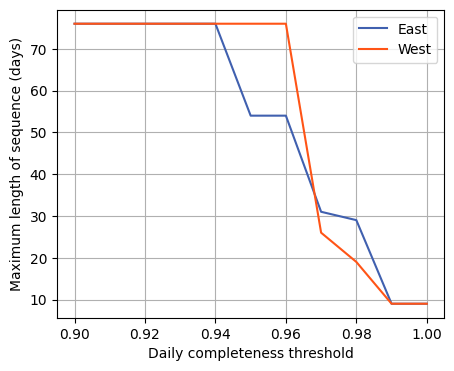

In [15]:
# visualise the results
plt.figure(figsize=(5, 4))
plt.plot(completeness_thresholds, sequence_length_east, label="East")
plt.plot(completeness_thresholds, sequence_length_west, label="West")
plt.xlabel("Daily completeness threshold")
plt.ylabel("Maximum length of sequence (days)")
plt.grid(True)
plt.legend()

In [ ]:
def plot_timeseries(ts_data, sensor_dir):
    """
    Function to plot the data from a selected timeseries.

    Args:
        ts_data: A DataFrame containing the timeseries data to plot.
        year: The year of the data.
        day_start: The starting day of the data in the year.

    Returns:
        None
    """
    day_start = ts_data.index.to_series().dt.dayofyear.min()
    year = ts_data.index.to_series().dt.year.min()
    plt.figure(figsize=(20, 4))
    plt.plot(ts_data["value"])
    plt.xticks(rotation=90)
    plt.title(f"{sensor_dir} sensor data starting from day {day_start} of {year}")
    plt.show()

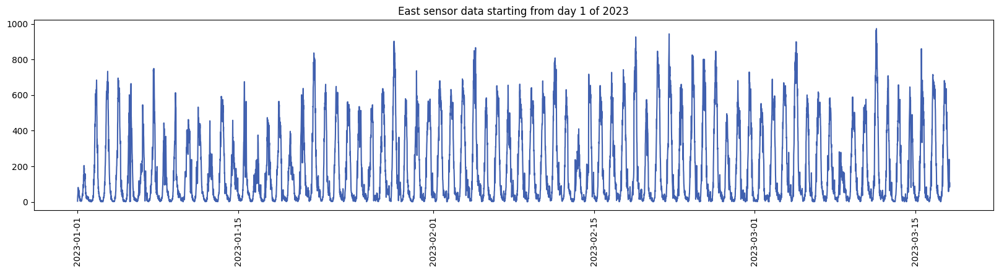

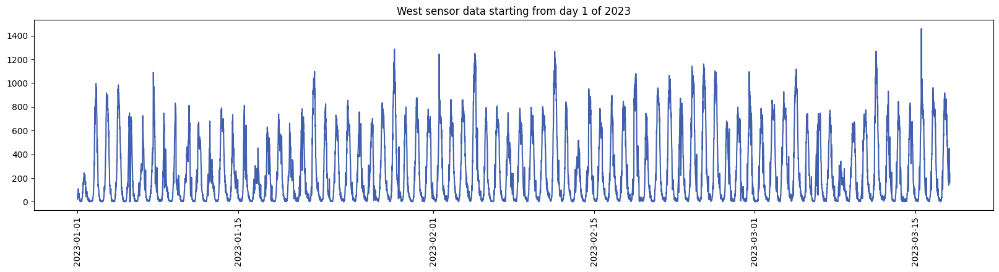

In [ ]:
if east_complete_sequence_df is not None:
    plot_timeseries(ts_data=east_complete_sequence_df, sensor_dir="East")

if west_complete_sequence_df is not None:
    plot_timeseries(ts_data=west_complete_sequence_df, sensor_dir="West")

(3.3)=
## 3.3 Derived Attributes / Records

* Discuss any new attributes or records that were derived from existing ones, such as creating new features through binning, combining attributes, or performing calculations.
* Explain why these transformations were done, and how these new attributes will contribute to the data mining goals.
* If applicable, describe any generation of synthetic data or aggregation of data at different levels.

### 3.3.1 Periodicity features

We are going to add a number of new features that are derived from existing data. These are periods for the strongest signals calculated using the Lomb-Scargle Periodogram. The purpose of this is to give context to the model for the position of values in the time series and enhance the models ability to learn time-dependent patterns which can offer a shortcut to LSTM learning time. This is especially important as there are a large number of missing days now that all non-complete days have been removed. 

Last leap year was Feb 29th 2020.

We can see that where there is missing data, it appears as distortion in the signal. As we are plotting the positional index on the x-axis it appears that the two signals do not line up. However if we were to plot the x-axis as a datetime index, we would see that they do indeed line up.

Text(0.5, 0.95, 'Periodicity features for each sensor')

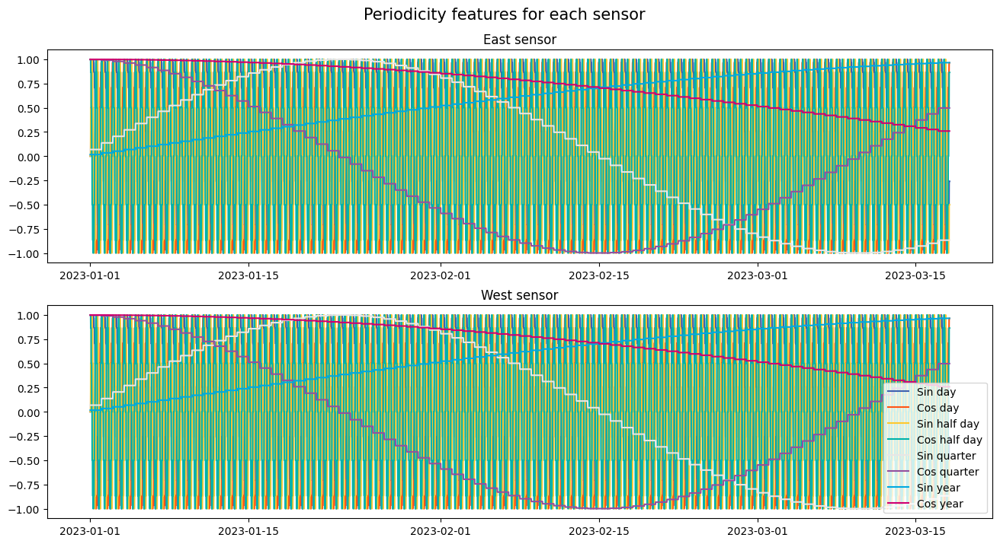

In [ ]:
from eda_helper import add_periodicity_features

SLIDE = 0

east_freq_df = add_periodicity_features(east_complete_sequence_df)
west_freq_df = add_periodicity_features(west_complete_sequence_df)

fig, ax = plt.subplots(2, 1, figsize=(16, 8))

legend_labels = [
    "Sin day",
    "Cos day",
    "Sin half day",
    "Cos half day",
    "Sin quarter",
    "Cos quarter",
    "Sin year",
    "Cos year",
]

east_cols = east_freq_df.columns[2:]
west_cols = west_freq_df.columns[2:]

# For the first subplot
for column, label in zip(east_cols, legend_labels):
    ax[0].plot(east_freq_df[column], label=label)
ax[0].set_title("East sensor")

# For the second subplot
for column, label in zip(west_cols, legend_labels):
    ax[1].plot(west_freq_df[column], label=label)
ax[1].set_title("West sensor")
ax[1].legend(loc="lower right")

fig.suptitle("Periodicity features for each sensor", y=0.95, fontsize=15)

### 3.3.2 University term features

We are also going to create some data to represent the university term times over the study period. 

In [ ]:
from eda_helper import add_term_dates

east_terms_df = add_term_dates(east_freq_df)
west_terms_df = add_term_dates(west_freq_df)

In [ ]:
east_terms_df["newcastle_term"].value_counts()

newcastle_term
True     6483
False     759
Name: count, dtype: int64

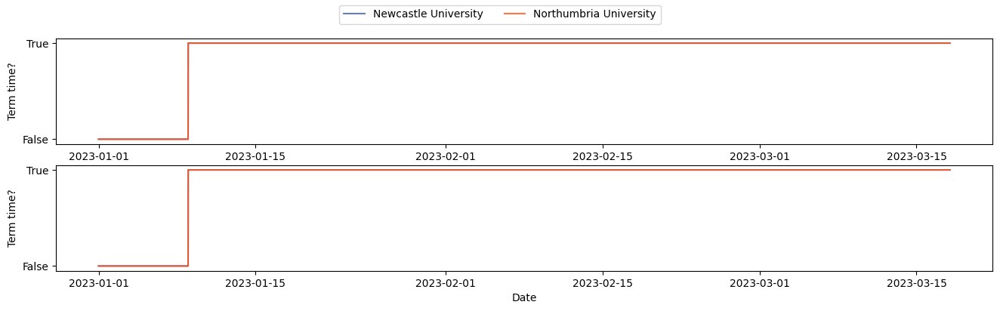

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(16, 4))
names = ["Newcastle University", "Northumbria University"]
for column, name in zip(east_terms_df.columns[10:], names):
    ax[0].plot(east_terms_df[column], alpha=0.8, label=name)
    ax[0].set_yticks([0, 1], ["False", "True"])
    ax[0].set_ylabel("Term time?")
    ax[0].set_xlabel("Date")
    ax[1].plot(west_terms_df[column], alpha=0.8)
    ax[1].set_yticks([0, 1], ["False", "True"])
    ax[1].set_ylabel("Term time?")
    ax[1].set_xlabel("Date")
fig.legend(loc="upper center", ncol=2)

(3.4)=
## 3.4 Merged Data

* Describe any data that was merged or joined together from different sources or tables.
* Discuss the methods used to combine the data and any difficulties faced (like inconsistencies or discrepancies between the datasets).
* Explain how any issues were resolved (e.g., how discrepancies were reconciled).
* Detail how the merged data was validated to ensure correctness.

We are going to add the term dates to the data for use in the model. We will merge the dataframe with the sensor index first to get the correct values.

In [ ]:
east_terms_df.head()

,value,date,sin_day,cos_day,sin_half_day,cos_half_day,sin_quarter,cos_quarter,sin_year,cos_year,newcastle_term,northumbria_term
dt,,,,,,,,,,,,
2023-01-01 00:00:00,4,2023-01-01,0.000000,1.000000,0.0,1.000000,0.068802,0.99763,0.017213,0.999852,False,False
2023-01-01 00:15:00,27,2023-01-01,0.000000,1.000000,0.0,1.000000,0.068802,0.99763,0.017213,0.999852,False,False
2023-01-01 00:30:00,35,2023-01-01,0.000000,1.000000,0.0,1.000000,0.068802,0.99763,0.017213,0.999852,False,False
2023-01-01 00:45:00,44,2023-01-01,0.000000,1.000000,0.0,1.000000,0.068802,0.99763,0.017213,0.999852,False,False
2023-01-01 01:00:00,52,2023-01-01,0.258819,0.965926,0.5,0.866025,0.068802,0.99763,0.017213,0.999852,False,False


(3.5)=
## 3.5 Reformatted Data

* Describe the process of reformatting the data for modeling or visualization purposes.
* Discuss any transformations of the data into different types (e.g., numerical to categorical, date-time conversions), creation of dummy variables, or re-scaling of features.
* Explain how and why any re-sampling procedures were done, if applicable.
* Discuss the format that the final dataset(s) will be in for the subsequent modeling or visualization stage.

First we need to scale the data to improve GD (Gradient Descent) convergence and avoid vanishing/exploding gradients both of which slow down model training. We will use `sklearn.preprocessing.MinMaxScaler` as our data is discrete and follows a heavily right skewed mixture distribution with a long tail and an exponential component. It is important that we preserve the shape of original distribution. 

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))
east_scaled_timeseries = scaler.fit_transform(east_terms_df.drop(columns=["date"]))
west_scaled_timeseries = scaler.fit_transform(west_terms_df.drop(columns=["date"]))

In [ ]:
east_scaled_timeseries.shape, west_scaled_timeseries.shape

((7242, 11), (7253, 11))

In [ ]:
east_scaled_timeseries.min(), east_scaled_timeseries.max(), west_scaled_timeseries.min(), west_scaled_timeseries.max()

(0.0, 1.0, 0.0, 1.0)

## Model 0 - Baseline
This model takes the current value as input and returns it for the next time step, effectively predicting "no change". As our model can currently only predict a single time step into the future and the prediction will not change as window length increases. We can add an option to increase the number of predictions that the model makes however and see how performance changes as the number of time steps is increased. For single time-steps the baseline should be a reasonable estimate as the number of pedestrians generally changes slowly throughout the day. First we need to change our `pandas.core.series.Series` object into a `numpy.ndarray` object. We are dealing with a single dimensional array and the values form a time vector i.e. they are an ordered list. 

We then want to split the data into windows. In our first test run, we use a week of continuous data, and split it into windows of `WINDOWSIZE=1` and `HORIZON=1`. The baseline model will take the input and return that value as the output. We will then calculate some scores to see how far the predictions are from the labels. 

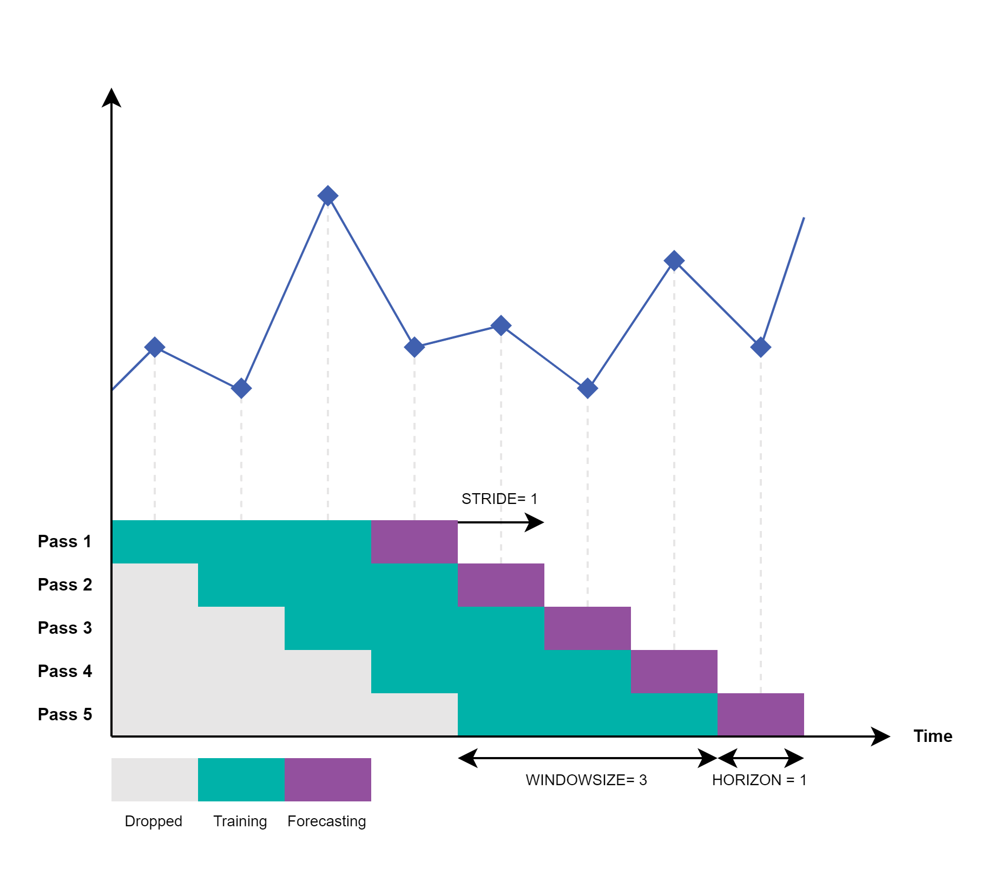

In [ ]:
from IPython import display
import os

display.Image(
    os.path.join(os.getcwd(), "graphics\sliding_window_w3h3s1.png"),
    width=768,
    height=768,
)

Inputs array shape: torch.Size([167, 4]) | Target array shape: torch.Size([167, 4])
Inputs type: <class 'torch.Tensor'> | Targets type: <class 'torch.Tensor'>


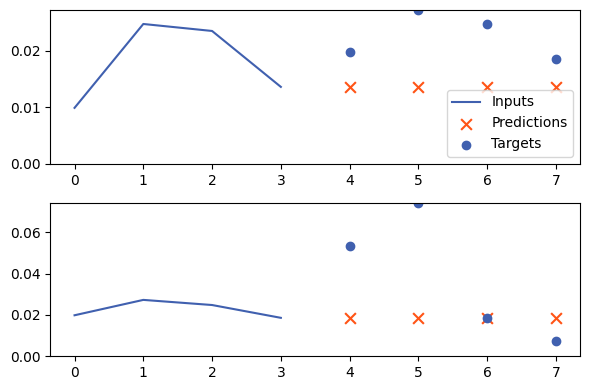

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import matplotlib.animation as animation
import IPython.display as ipy
from IPython.display import HTML
from eda_helper import sliding_windows, plot_windows


WINDOW_SIZE = 4
HORIZON = 4
STRIDE = 4
inputs, targets = sliding_windows(east_scaled_timeseries, WINDOW_SIZE, HORIZON, STRIDE)
print(
    f"Inputs array shape: {inputs.squeeze().shape} | Target array shape: {targets.squeeze().shape}"
)
print(f"Inputs type: {type(inputs)} | Targets type: {type(targets)}")


class Model0(nn.Module):
    def __init__(self, horizon):
        super().__init__()
        self.horizon = horizon

    def forward(self, x):
        # Get the last element from each input sequence
        last_values = x[:, -1:]
        # Repeat this value to match the horizon length
        return last_values.expand(-1, self.horizon)


baseline = Model0(HORIZON)

predictions = baseline(inputs.squeeze())

plot_windows(inputs, predictions, targets, num_plots=2, step=1)

In [ ]:
plt.ioff()  # Turn off interactive plotting

fig, ax = plt.subplots(1, 1, figsize=(6, 4))


def animate(i):
    ax.clear()
    ax.plot(
        range(len(inputs[i])),
        inputs[i],
        label="Inputs",
        color=custom_palette[0],
    )
    ax.scatter(
        range(len(inputs[i]), len(inputs[i]) + len(predictions[i])),
        predictions[i],
        label="Predictions",
        color=custom_palette[1],
        marker="x",
        s=60,
    )
    ax.scatter(
        range(len(inputs[i]), len(inputs[i]) + len(targets[i])),
        targets[i],
        label="Targets",
        color=custom_palette[0],
    )
    ax.legend()
    ax.set_title(f"Window {i+1}")
    ax.set_ylim(0, inputs.max())


# Assign the FuncAnimation to a variable
ani = animation.FuncAnimation(fig, animate, frames=len(inputs[:96]), repeat=True)

# Create a display object
display_obj = HTML(ani.to_jshtml())

# Display the object
ipy.display(display_obj)

### Model 0 Performance

In [ ]:
targets.squeeze().flatten().shape, predictions.flatten().shape

(torch.Size([668]), torch.Size([668]))

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Flattening predictions and targets for metric calculations
predictions_flat_np = predictions.flatten().detach().numpy()
targets_flat_np = targets.flatten().detach().numpy()

# Mean Absolute Error (MAE)
mae = mean_absolute_error(targets_flat_np, predictions_flat_np)
print(f"Mean Absolute Error (MAE): {mae}")

# Mean Squared Error (MSE)
mse = mean_squared_error(targets_flat_np, predictions_flat_np)
print(f"Mean Squared Error (MSE): {mse}")

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Symmetric Mean Absolute Percentage Error (SMAPE)
epsilon = 1e-10  # stops divide by zero error
smape = (
    np.mean(
        2.0
        * np.abs(targets_flat_np - predictions_flat_np)
        / (np.abs(targets_flat_np) + np.abs(predictions_flat_np) + epsilon)
    )
    * 100
)
print(f"Symmetric Mean Absolute Percentage Error (SMAPE): {smape}%")

# R-squared (R²)
r2 = r2_score(targets_flat_np, predictions_flat_np)
print(f"R-squared (R²): {r2}")

# Create a dictionary with the metrics
metrics = {
    "Model": "Baseline",
    "MAE": mae,
    "MSE": mse,
    "RMSE": rmse,
    "SMAPE": smape,
    "R^2": r2,
}

performance_df = pd.DataFrame(columns=["Model", "MAE", "MSE", "RMSE", "SMAPE", "R^2"])

# Append the dictionary to the DataFrame
metrics_df = pd.DataFrame(metrics, index=[0])
performance_df = pd.concat([performance_df, metrics_df])

# Print the DataFrame
print(performance_df.round(3))

Mean Absolute Error (MAE): 0.05719787999987602
Mean Squared Error (MSE): 0.007734815590083599
Root Mean Squared Error (RMSE): 0.0879478007555008
Symmetric Mean Absolute Percentage Error (SMAPE): 42.62363612651825%
R-squared (R²): 0.8907532939118723
      Model    MAE    MSE   RMSE   SMAPE    R^2
0  Baseline  0.057  0.008  0.088  42.624  0.891


## Model 1: Simple LSTM
For our first LSTM model, we will use a single LSTM layer and a linear output layer. The model is only capable of providing a single time step output, so the distance we want to predict into the future depends on the frequency of data points that we feed into out from our generated windows. To begin with we attempt to predict 15 minutes into the future as this is the highest frequency of measurements we have for training. Later on we may aggregate to hourly or daily measurements to allow us to predict further into the future. 

In [ ]:
train_size = int(len(east_scaled_timeseries) * 0.67)
test_size = len(east_scaled_timeseries) - train_size
train, test = east_scaled_timeseries[:train_size], east_scaled_timeseries[train_size:]

WINDOW_SIZE = 40
HORIZON = 1

X_train, y_train = sliding_windows(train, WINDOW_SIZE, HORIZON)
X_test, y_test = sliding_windows(test, WINDOW_SIZE, HORIZON)
print()
print(f"Train input tensor: {X_train.shape} | Train target tensor: {y_train.shape}")
print()
print(f"Test input tensor: {X_test.shape} | Test target tensor: {y_test.shape}")


Train input tensor: torch.Size([410, 40, 1]) | Train target tensor: torch.Size([410, 1, 1])

Test input tensor: torch.Size([182, 40, 1]) | Test target tensor: torch.Size([182, 1, 1])


In [ ]:
class LSTMModel1(nn.Module):
    def __init__(self, *args, **kwargs) -> torch.Tensor:
        super().__init__(*args, **kwargs)
        self.lstm = nn.LSTM(
            input_size=1, hidden_size=50, num_layers=1, batch_first=True
        )
        self.linear = nn.Linear(50, 1)

    def forward(self, x):
        x, _ = self.lstm(x)
        x = self.linear(x)
        return x[:, -1, :]  # Selecting the last output of the sequence

Here we create a function for training and evaluating our data. The function saves the following results from the training loop: Window size; Epoch; Train RMSE; Test RMSE. 

In [ ]:
from matplotlib import animation
from IPython.display import HTML
import matplotlib.pyplot as plt
import matplotlib

EPOCHS = 10
device = "cpu"


# A function to train the model and record the training data
def train_model_and_record_data(
    X_train,
    y_train,
    X_test,
    y_test,
    window_size=WINDOW_SIZE,
    epochs=EPOCHS,
    device=device,
):
    LSTM_v1 = LSTMModel1().to(device)
    optimiser = optim.Adam(LSTM_v1.parameters())
    loss_fn = nn.MSELoss()
    loader = data.DataLoader(
        data.TensorDataset(X_train, y_train.squeeze(-1)), shuffle=True, batch_size=8
    )

    training_data_per_window = []

    for epoch in range(epochs):
        LSTM_v1.train()
        for X_batch, y_batch in loader:
            y_pred = LSTM_v1(X_batch)
            loss = loss_fn(y_pred, y_batch)
            optimiser.zero_grad()
            loss.backward()
            optimiser.step()

        LSTM_v1.eval()
        with torch.inference_mode():
            y_pred = LSTM_v1(X_train)
            train_rmse = np.sqrt(loss_fn(y_pred, y_train.squeeze(-1))).item()
            test_pred = LSTM_v1(X_test)
            test_rmse = np.sqrt(loss_fn(test_pred, y_test.squeeze(-1))).item()

            train_plot = np.ones_like(timeseries_east) * np.nan
            y_pred = LSTM_v1(X_train)
            y_pred = y_pred[:, -1]
            train_plot[window_size:train_size] = np.expand_dims(
                y_pred.detach().numpy(), axis=1
            )

            test_plot = np.ones_like(timeseries_east) * np.nan
            test_pred = LSTM_v1(X_test)[:, -1]
            test_plot[train_size + window_size : len(timeseries_east)] = np.expand_dims(
                test_pred.detach().numpy(), axis=1
            )

            # Add the data for this epoch to the list
            training_data_per_window.append(
                (epoch, train_plot, test_plot, train_rmse, test_rmse)
            )

            if (epoch + 1) % 10 != 0:
                continue

            print(
                f"Window size: {window_size} | Epoch: {epoch+1} | Train RMSE: {train_rmse:.4f} | Test RMSE: {test_rmse:.4f}"
            )

    return training_data_per_window

In [ ]:
# Main code
training_data = []

device = "cuda" if torch.cuda.is_available() else "cpu"
torch.manual_seed(42)

EPOCHS = 10
WINDOW_SIZES = [2, 3, 4, 6, 8, 10, 15, 20]

for window_size in WINDOW_SIZES:
    X_train, y_train = sliding_windows(train, window_size, HORIZON)
    X_test, y_test = sliding_windows(test, window_size, HORIZON)

    training_data_per_window = train_model_and_record_data(
        X_train, y_train, X_test, y_test, window_size, EPOCHS, device
    )

    # Add the data for this window to the main training_data list
    training_data.extend([(window_size,) + data for data in training_data_per_window])

# Set the animation embed limit
matplotlib.rcParams["animation.embed_limit"] = 2**100

# Create the initial plot
fig, ax = plt.subplots()

x_coords = np.arange(len(east_scaled_timeseries))

(line1,) = ax.plot(x_coords, east_scaled_timeseries, c=custom_palette[0])
(line2,) = ax.plot(
    x_coords, np.full_like(east_scaled_timeseries, np.nan), c=custom_palette[1]
)
(line3,) = ax.plot(
    x_coords, np.full_like(east_scaled_timeseries, np.nan), c=custom_palette[2]
)


# Animation update function
def animate(i):
    line2.set_ydata(training_data[i][2])
    line3.set_ydata(training_data[i][3])
    ax.set_title(
        f"Window Size: {training_data[i][0]} | Epoch: {training_data[i][1]+1} | Train RMSE: {training_data[i][4]:.4f} | Test RMSE: {training_data[i][5]:.4f}"
    )
    return (
        line1,
        line2,
        line3,
    )


# Create the animation
ani = animation.FuncAnimation(
    fig, animate, frames=len(training_data), interval=100, blit=True, repeat=True
)

# Display the animation
HTML(ani.to_jshtml())

Window size: 2 | Epoch: 10 | Train RMSE: 0.0597 | Test RMSE: 0.0682
Window size: 3 | Epoch: 10 | Train RMSE: 0.0681 | Test RMSE: 0.0753
Window size: 4 | Epoch: 10 | Train RMSE: 0.0703 | Test RMSE: 0.0869
Window size: 6 | Epoch: 10 | Train RMSE: 0.0717 | Test RMSE: 0.0869
Window size: 8 | Epoch: 10 | Train RMSE: 0.0629 | Test RMSE: 0.0716
Window size: 10 | Epoch: 10 | Train RMSE: 0.0587 | Test RMSE: 0.0685
Window size: 15 | Epoch: 10 | Train RMSE: 0.0587 | Test RMSE: 0.0691
Window size: 20 | Epoch: 10 | Train RMSE: 0.0601 | Test RMSE: 0.0724


In [ ]:
import matplotlib

matplotlib.rcParams["animation.embed_limit"] = 2**100
# Initial plot
fig, ax = plt.subplots()

x_coords = np.arange(len(east_scaled_timeseries))


(line1,) = ax.plot(x_coords, east_scaled_timeseries, c=custom_palette[0])
(line2,) = ax.plot(
    x_coords, np.full_like(east_scaled_timeseries, np.nan), c=custom_palette[1]
)
(line3,) = ax.plot(
    x_coords, np.full_like(east_scaled_timeseries, np.nan), c=custom_palette[2]
)


def animate(i):
    # Update the data for each line
    line2.set_ydata(training_data[i][2])
    line3.set_ydata(training_data[i][3])

    # Update the title with the current RMSE
    ax.set_title(
        f"Window Size: {training_data[i][0]} | Epoch: {training_data[i][1]} | Train RMSE: {training_data[i][4]:.4f} | Test RMSE: {training_data[i][5]:.4f}"
    )

    return (
        line1,
        line2,
        line3,
    )


# Create the animation
ani = animation.FuncAnimation(
    fig, animate, frames=len(training_data), interval=100, blit=True, repeat=True
)

# Display the animation
HTML(ani.to_jshtml())

In [ ]:
y_pred = LSTM_v1(X_test)
X_test.shape, y_pred.unsqueeze(2).shape, y_test.shape

NameError: name 'LSTM_v1' is not defined

In [ ]:
plt.ioff()  # Turn off interactive plotting

fig, ax = plt.subplots(1, 1, figsize=(6, 4))


def animate(i):
    ax.clear()
    ax.plot(
        range(len(inputs[i])),
        inputs[i],
        label="Inputs",
        color=custom_palette[0],
    )
    ax.scatter(
        range(len(inputs[i]), len(inputs[i]) + len(predictions[i])),
        predictions[i],
        label="Predictions",
        color=custom_palette[1],
        marker="x",
        s=60,
    )
    ax.scatter(
        range(len(inputs[i]), len(inputs[i]) + len(targets[i])),
        targets[i],
        label="Targets",
        color=custom_palette[0],
    )
    ax.legend()
    ax.set_title(f"Window {i+1}")
    ax.set_ylim(0, inputs.max())


# Assign the FuncAnimation to a variable
ani = animation.FuncAnimation(fig, animate, frames=len(inputs[:96]), repeat=True)

# Create a display object
display_obj = HTML(ani.to_jshtml())

# Display the object
ipy.display(display_obj)

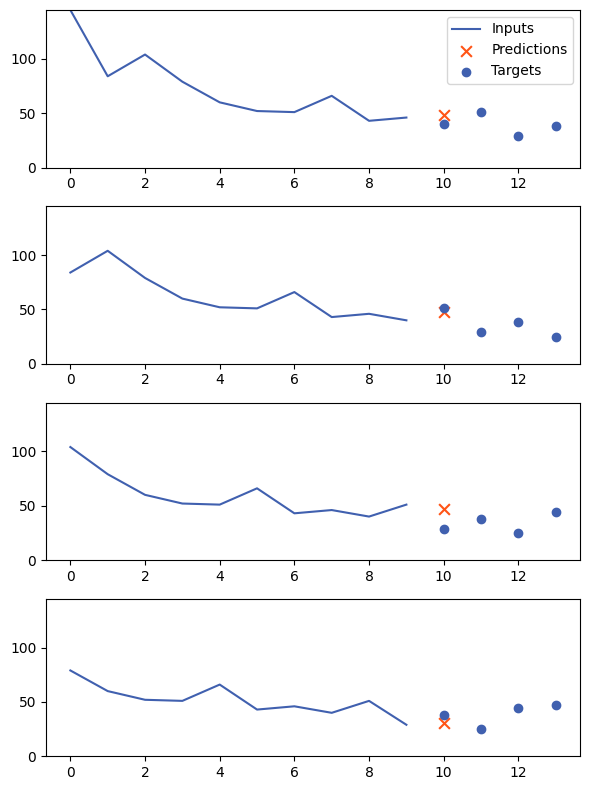

In [ ]:
plot_windows(X_test, y_pred.unsqueeze(2).detach().numpy(), y_test, num_plots=4, step=1)

Windowing, also known as "rolling windows" or "sliding windows," is a common method used in time series analysis and is often used with machine learning models. However, whether it's essential or not depends largely on the specific task, data characteristics, and the model being used.

Here are some points to consider:

**Sequence Learning**: Many machine learning models, especially those used for time series like Recurrent Neural Networks (RNNs) and its variants (like LSTM and GRU), require input in the form of sequences. They make predictions based on the "memory" of past data points. Windowing is a way of creating these sequences from a time series.

**Stationarity**: Windowing can help make a time series more stationary (i.e., its properties do not depend on the time at which the series is observed) by creating a series of differences between values in the window, which is a requirement for certain models.

**Feature Engineering**: Windowing can also be used for feature engineering, where you create new features based on a window of values - such as rolling averages, standard deviations, etc. This can help capture trends and seasonality in the data which can be crucial for the performance of the models.

**Reduce Noise**: A windowed average can sometimes help reduce noise and smooth out short-term fluctuations, which may be beneficial for the model.

**Temporal Dependencies**: In time-series problems, current outputs can be dependent on previous inputs or outputs (auto-regressive nature). Windowing allows capturing these temporal dependencies.

However, it's worth noting that windowing is just one of many techniques in time series analysis. Depending on the nature of your problem, other techniques may also be applicable and useful. It is always recommended to understand your data and problem thoroughly and choose the techniques that are most appropriate for your specific use case.

Aside from windowing, there are various techniques used in time series analysis, including:

* Autoregression (AR): Models the next step in the sequence as a linear function of the observations at prior time steps.
* Moving Average (MA): Models the next step in the sequence as a linear function of the residual errors from a mean process at prior time steps.
* Autoregressive Moving Average (ARMA): Models the next step in the sequence as a linear function of the observations and residual errors at prior time steps.
* Autoregressive Integrated Moving Average (ARIMA): An extension of ARMA that can model a wide range of time series data.
* Seasonal Autoregressive Integrated Moving-Average (SARIMA): An extension of ARIMA that explicitly supports univariate time series data with a seasonal component.
* Vector Autoregression (VAR): Models the next step in each time series using an AR model.
* Vector Autoregression Moving-Average (VARMA): Models the next step in each time series using an ARMA model.
* Vector Autoregression Moving-Average with Exogenous Regressors (VARMAX): An extension of the VARMA model that also includes the modeling of exogenous variables.
* Simple Exponential Smoothing (SES): Models the next time step as an exponentially weighted linear function of observations at prior time steps.
* Holt Winter’s Exponential Smoothing (HWES): Models the next step in the sequence as an exponentially weighted linear function of observations at prior time steps, taking trends and seasonality into account.